In [ ]:
import os

In [ ]:
# change current working directory
os.chdir('Downloads/CNN/')

In [ ]:
# os.chdir('first forensics/image-forensics/')

In [ ]:
!pwd

/home/kiran/Downloads/CNN


# EDA on image tempered dataset

The rapid increase in digital tools and their availability to the world has made an exponential increase in the manipulation of images. It has severe consequences like communicating misinformation, creating fake news and often altering the evidence. With the continuous evaluation of digital forgery techniques, It is very important to counter such manipulated Images. Countering such images with simple naked eye observation or with trained eye observation is difficult and nowadays it is close to impossible. Since any manipulation is noise or disturbance induced upon the original image, detection of image manipulation is always possible (At Least it is believed to be possible). Here in this experiment, I am working on an IEEE 2013 First Image Forensic competition dataset to create an AI algorithm to automatically detect such manipulated images.

- The images are divided into images which we call pristine or  never manipulated
- The images will be cropped/resized to a standard size of 1024 x 768 for the contest or close to this to respect original aspect ratio using the same procedure and will be released in the PNG format.
- The "pristine" images come as they were captured in the acquisition devices with no further editing besides the resizing and manipulation necessary to put them in the standard challenge resolution.
- The test images are provided along tempered mask

##### Goals
- Given an Image Identify wheather it is fake or not
- If Given image is fake, identify and produce a mask of the tampered region

##### Evaluation Metrics
- Binary Cross entropy, accuracy and AUC for classification problem
- For evaluation of the performance of localization we use F1 score.

## 1.0. Imports

In [ ]:
## all imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os
import re
import random
from pathlib import Path
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing import image
from PIL import Image
import matplotlib.patches as patches
import datetime

import random
from sklearn.metrics import log_loss
from sklearn.metrics import roc_curve
import sqlite3

# plotly graph imports
from chart_studio import plotly
from plotly import tools
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)
from tqdm import tqdm
import png
from sklearn.model_selection import train_test_split
import shutil
from prettytable import PrettyTable

# tensorflow imports
from tensorflow.keras.layers import Conv2D, BatchNormalization, Dropout, MaxPooling2D, Dense, Input, Activation, AveragePooling2D, Flatten, ZeroPadding2D
from tensorflow.keras.layers import Conv1D, MaxPooling1D, GlobalAvgPool1D
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import RandomNormal, GlorotNormal
from tensorflow.keras.utils import plot_model
from scipy.ndimage.interpolation import rotate
from scipy import signal
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf


import pywt
from matplotlib import pyplot as plt
from pywt._doc_utils import wavedec2_keys, draw_2d_wp_basis

import warnings
warnings.filterwarnings("ignore")

##  1.1. Utils

In [ ]:
def show_image(path: str):
    print(path)
    img = cv2.imread(path)
    height, width, channels = img.shape
    print(str(height) + " " + str(width) + " " + str(channels))
    plt.imshow(img)
    plt.show()

In [ ]:

def count_number_of_images(folder: str):
    names = [name for name in os.listdir(folder)]
    return len(names)

In [ ]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
  '''))
  init_notebook_mode(connected=False)

In [ ]:
def get_roc_curve_values(y_true, y_pred):
  return roc_curve(y_true, y_pred)

## 2.0.Total size of the data available

First Image Forensics challenge dataset(only tampered images and ground truths)

In [ ]:
root_directory = Path('./phase-01-training/dataset-dist/phase-01/training/fake/')
print("Total size of the data in GB: ",
(sum(f.stat().st_size for f in root_directory.glob('**/*') if f.is_file()) / (1024 * 1024 * 1024)))

Total size of the data in GB:  1.2026169719174504


CASIA v2.0 dataset (only tampered images)

In [ ]:
# size of the CASIA v2.0
root_directory = Path('./CASIA-2.0/Tp/')
print("Total size of the data in GB: ",
(sum(f.stat().st_size for f in root_directory.glob('**/*') if f.is_file()) / (1024 * 1024 * 1024)))

Total size of the data in GB:  2.9332187296822667


**CASIA v2.0 dataset(only pristine images)**

In [ ]:
# size of the CASIA v2.0
root_directory = Path('./CASIA-2.0/Au/')
print("Total size of the data in GB: ",
(sum(f.stat().st_size for f in root_directory.glob('**/*') if f.is_file()) / (1024 * 1024 * 1024)))

Total size of the data in GB:  0.33765076752752066


**First Image forensics challenge dataset(only pristine images)**

In [ ]:
# size of the CASIA v2.0
root_directory = Path('./phase-01-training/dataset-dist/phase-01/training/pristine/')
print("Total size of the data in GB: ",
(sum(f.stat().st_size for f in root_directory.glob('**/*') if f.is_file()) / (1024 * 1024 * 1024)))

Total size of the data in GB:  1.4274285212159157


### 2.1. Number of images in each category

In [ ]:
fake_training = count_number_of_images('../image-tampering-detection/original/fake/')
print('number of fake images First Forensics dataset', (fake_training - 1) / 2)
pristine_training = count_number_of_images('../image-tampering-detection/phase-01/training/pristine/')
print('number of pristine images First Forensics dataset', pristine_training)
fake_training_CASIA = count_number_of_images('../CASIA-2.0/Tp/')
print('number of fake images Fake training CASIA', fake_training_CASIA)
pristine_training_CASIA = count_number_of_images('../CASIA-2.0/Au/')
print('number of fake images pristine training CASIA', pristine_training_CASIA)

number of fake images First Forensics dataset 450.0
number of pristine images First Forensics dataset 1050
number of fake images Fake training CASIA 5123
number of fake images pristine training CASIA 7492


### 2.2. Some fake images along with mask

../phase-01-training/dataset-dist/phase-01/training/fake/c3cd547094fa52e65a22228bba5ef189.png
768 1024 3


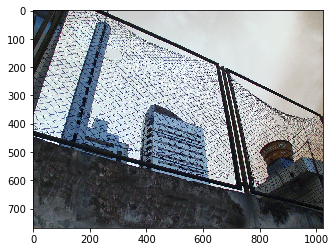

c3cd547094fa52e65a22228bba5ef189.png
c3cd547094fa52e65a22228bba5ef189.mask.png
../phase-01-training/dataset-dist/phase-01/training/fake/c3cd547094fa52e65a22228bba5ef189.mask.png
768 1024 3


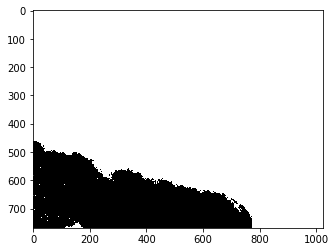

../phase-01-training/dataset-dist/phase-01/training/fake/0294345b3b2324b195cb3b30e91d7678.png
600 800 3


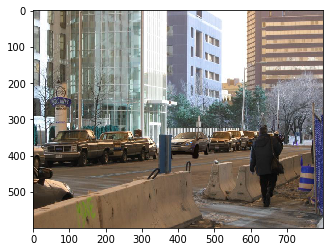

0294345b3b2324b195cb3b30e91d7678.png
0294345b3b2324b195cb3b30e91d7678.mask.png
../phase-01-training/dataset-dist/phase-01/training/fake/0294345b3b2324b195cb3b30e91d7678.mask.png
600 800 3


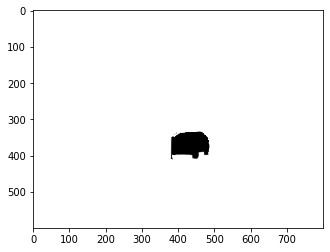

In [ ]:
for i in range(4):
    path = "../phase-01-training/dataset-dist/phase-01/training/fake"
    name = os.listdir(path)[i]
    match = re.search(r'(mask)', name)
    if not match: 
        show_image(path + '/'+ name)
        print(name)
        print(name[0:(len(name)-4)] + '.mask.png')
        show_image(path + '/' + name[0:(len(name)-4)] + '.mask.png')

### 2.3. some pristine images

../phase-01-training/dataset-dist/phase-01/training/pristine/5feef3fbdbae3e67f110e08eb12da937.png
768 1024 3


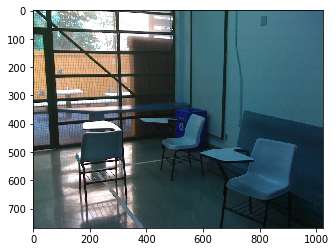

../phase-01-training/dataset-dist/phase-01/training/pristine/1fc25a4373e329f72e8770b9446ec0a0.png
768 1024 3


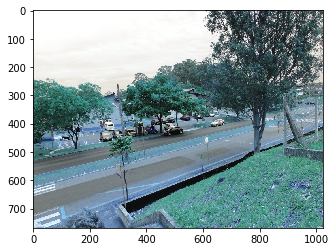

../phase-01-training/dataset-dist/phase-01/training/pristine/2eb515a0b14569b9c98f3cb7e0a62686.png
768 1024 3


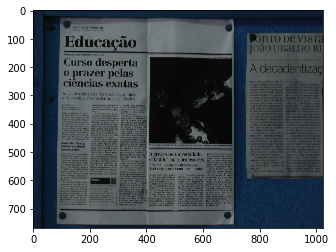

In [ ]:
for i in range(3):
    path = "../phase-01-training/dataset-dist/phase-01/training/pristine"
    name = os.listdir(path)[i]
    show_image(path + '/'+ name)

### 2.4. shapes of the images

In [ ]:
pristine_image_shapes = []
fake_image_shapes = []
mask_shapes = []

# CASIA v2.0 shapes
pristine_image_shapes_c = []
fake_image_shapes_c = []
mask_shapes_c = []

for i in os.listdir('../image-tampering-detection/phase-01/training/pristine/'):
  img = cv2.imread('../image-tampering-detection/phase-01/training/pristine/' + i)
  try:
    pristine_image_shapes.append(img.shape)
  except: 
    continue

for i in os.listdir('./first-image-forensics-masks/'):
  img = cv2.imread('./first-image-forensics-masks/' + i)
  try:
    mask_shapes.append(img.shape)
  except:
    continue

for i in os.listdir('../image-tampering-detection/original/fake/'):
  img = cv2.imread('../image-tampering-detection/original/fake/' + i)
  try:
    fake_image_shapes.append(img.shape)
  except:
    continue

for i in os.listdir('../CASIA-2.0/Au/'):
  img = cv2.imread('../CASIA-2.0/Au/' + i)
  try:
    pristine_image_shapes_c.append(img.shape)
  except:
    continue

for i in os.listdir('../CASIA-2-Groundtruth/'):
  img = cv2.imread('../CASIA-2-Groundtruth/' + i)
  try:
    mask_shapes_c.append(img.shape)
  except:
    continue

for i in os.listdir('../CASIA-2.0/Tp/'):
  img = cv2.imread('../CASIA-2.0/Tp/' + i)
  try:
    fake_image_shapes_c.append(img.shape)
  except:
    continue

In [ ]:
# x = PrettyTable()
# column_names = ["pristine_FIF", "fake_FIF", "mask_FIF", "pristin_CASIA", "fake_CASIA", "mask_CASIA"]
# x.add_column(column_names[0], pristine_image_shapes)
# x.add_column(column_names[1], fake_image_shapes)
# x.add_column(column_names[2], mask_shapes)
# x.add_column(column_names[3], pristine_image_shapes_c)
# x.add_column(column_names[4], fake_image_shapes_c)
# x.add_column(column_names[3], mask_shapes_c)

# print(x)
set(pristine_image_shapes)

{(575, 1024, 3),
 (680, 1024, 3),
 (681, 1024, 3),
 (683, 1024, 3),
 (768, 576, 3),
 (768, 1020, 3),
 (768, 1024, 3)}

In [ ]:
set(fake_image_shapes)

{(480, 640, 3),
 (563, 798, 3),
 (570, 760, 3),
 (595, 1025, 3),
 (600, 800, 3),
 (648, 1152, 3),
 (691, 922, 3),
 (720, 960, 3),
 (750, 1000, 3),
 (765, 1024, 3),
 (768, 1024, 3),
 (771, 1024, 3),
 (778, 1037, 3),
 (792, 1188, 3),
 (806, 1075, 3),
 (900, 1600, 3),
 (933, 1600, 3),
 (960, 1280, 3),
 (972, 1296, 3),
 (994, 1680, 3),
 (1000, 1504, 3),
 (1024, 768, 3),
 (1042, 1389, 3),
 (1067, 1600, 3),
 (1071, 1600, 3),
 (1072, 1424, 3),
 (1109, 1663, 3),
 (1152, 1536, 3),
 (1188, 792, 3),
 (1200, 1600, 3),
 (1200, 1800, 3),
 (1286, 1709, 3),
 (1536, 2048, 3),
 (1637, 2352, 3),
 (1920, 2560, 3),
 (1936, 2592, 3),
 (1944, 2592, 3),
 (2048, 1536, 3),
 (2112, 2816, 3),
 (2144, 2848, 3),
 (2304, 3072, 3),
 (2592, 1936, 3),
 (2736, 3648, 3),
 (2748, 3664, 3),
 (2758, 4150, 3),
 (2848, 4272, 3),
 (2976, 3968, 3),
 (3000, 4000, 3),
 (3072, 2304, 3),
 (3216, 4288, 3),
 (3240, 4320, 3),
 (4000, 3000, 3),
 (4288, 3216, 3)}

In [ ]:
set(mask_shapes)

{(480, 640, 3),
 (563, 798, 3),
 (570, 760, 3),
 (595, 1025, 3),
 (598, 848, 3),
 (600, 800, 3),
 (648, 1152, 3),
 (691, 922, 3),
 (720, 960, 3),
 (750, 1000, 3),
 (765, 1024, 3),
 (768, 1024, 3),
 (771, 1024, 3),
 (778, 1037, 3),
 (792, 1188, 3),
 (806, 1075, 3),
 (900, 1600, 3),
 (933, 1600, 3),
 (960, 1280, 3),
 (972, 1296, 3),
 (994, 1680, 3),
 (1000, 1504, 3),
 (1024, 768, 3),
 (1042, 1389, 3),
 (1067, 1600, 3),
 (1071, 1600, 3),
 (1072, 1424, 3),
 (1109, 1663, 3),
 (1152, 1536, 3),
 (1188, 792, 3),
 (1200, 1600, 3),
 (1200, 1800, 3),
 (1286, 1709, 3),
 (1536, 2048, 3),
 (1637, 2352, 3),
 (1920, 2560, 3),
 (1936, 2592, 3),
 (1944, 2592, 3),
 (2048, 1536, 3),
 (2112, 2816, 3),
 (2144, 2848, 3),
 (2304, 3072, 3),
 (2592, 1936, 3),
 (2736, 3648, 3),
 (2748, 3664, 3),
 (2758, 4150, 3),
 (2848, 4272, 3),
 (2976, 3968, 3),
 (3000, 4000, 3),
 (3072, 2304, 3),
 (3216, 4288, 3),
 (3240, 4320, 3),
 (4000, 3000, 3),
 (4288, 3216, 3)}

In [ ]:
set(pristine_image_shapes_c)

{(160, 240, 3),
 (180, 240, 3),
 (240, 160, 3),
 (243, 550, 3),
 (246, 384, 3),
 (256, 384, 3),
 (260, 445, 3),
 (261, 400, 3),
 (261, 800, 3),
 (272, 440, 3),
 (273, 492, 3),
 (279, 448, 3),
 (281, 550, 3),
 (284, 454, 3),
 (285, 451, 3),
 (286, 466, 3),
 (288, 344, 3),
 (288, 447, 3),
 (293, 640, 3),
 (297, 550, 3),
 (298, 550, 3),
 (300, 400, 3),
 (306, 550, 3),
 (306, 600, 3),
 (308, 623, 3),
 (309, 600, 3),
 (310, 550, 3),
 (311, 350, 3),
 (311, 546, 3),
 (311, 550, 3),
 (311, 640, 3),
 (312, 550, 3),
 (312, 576, 3),
 (312, 633, 3),
 (313, 550, 3),
 (313, 576, 3),
 (313, 595, 3),
 (314, 550, 3),
 (314, 594, 3),
 (315, 544, 3),
 (315, 550, 3),
 (316, 534, 3),
 (316, 550, 3),
 (317, 532, 3),
 (317, 549, 3),
 (317, 550, 3),
 (318, 528, 3),
 (318, 550, 3),
 (318, 600, 3),
 (319, 450, 3),
 (319, 550, 3),
 (320, 320, 3),
 (320, 480, 3),
 (320, 535, 3),
 (320, 550, 3),
 (320, 589, 3),
 (321, 450, 3),
 (321, 534, 3),
 (321, 550, 3),
 (322, 533, 3),
 (322, 600, 3),
 (323, 450, 3),
 (323, 6

In [ ]:
set(fake_image_shapes_c)

{(160, 240, 3),
 (180, 240, 3),
 (240, 160, 3),
 (243, 550, 3),
 (246, 384, 3),
 (256, 383, 3),
 (256, 384, 3),
 (260, 445, 3),
 (261, 400, 3),
 (261, 800, 3),
 (272, 440, 3),
 (273, 492, 3),
 (279, 448, 3),
 (281, 550, 3),
 (284, 454, 3),
 (285, 451, 3),
 (286, 466, 3),
 (288, 344, 3),
 (288, 441, 3),
 (293, 640, 3),
 (297, 550, 3),
 (298, 550, 3),
 (300, 400, 3),
 (306, 550, 3),
 (306, 600, 3),
 (308, 623, 3),
 (309, 600, 3),
 (310, 550, 3),
 (311, 350, 3),
 (311, 546, 3),
 (311, 550, 3),
 (311, 640, 3),
 (312, 550, 3),
 (312, 576, 3),
 (312, 633, 3),
 (313, 550, 3),
 (313, 576, 3),
 (313, 595, 3),
 (314, 550, 3),
 (314, 594, 3),
 (315, 544, 3),
 (315, 550, 3),
 (316, 534, 3),
 (316, 550, 3),
 (317, 532, 3),
 (317, 549, 3),
 (317, 550, 3),
 (318, 528, 3),
 (318, 550, 3),
 (318, 600, 3),
 (319, 450, 3),
 (319, 550, 3),
 (320, 320, 3),
 (320, 480, 3),
 (320, 535, 3),
 (320, 550, 3),
 (320, 589, 3),
 (321, 450, 3),
 (321, 534, 3),
 (321, 550, 3),
 (322, 533, 3),
 (322, 600, 3),
 (323, 4

In [ ]:
set(mask_shapes_c)

{(160, 240, 3),
 (180, 240, 3),
 (240, 160, 3),
 (243, 550, 3),
 (246, 384, 3),
 (256, 383, 3),
 (256, 384, 3),
 (260, 445, 3),
 (261, 400, 3),
 (261, 800, 3),
 (272, 440, 3),
 (273, 492, 3),
 (279, 448, 3),
 (281, 550, 3),
 (284, 454, 3),
 (285, 451, 3),
 (286, 466, 3),
 (288, 344, 3),
 (288, 441, 3),
 (293, 640, 3),
 (297, 550, 3),
 (298, 550, 3),
 (300, 400, 3),
 (306, 550, 3),
 (306, 600, 3),
 (308, 623, 3),
 (309, 600, 3),
 (310, 550, 3),
 (311, 350, 3),
 (311, 546, 3),
 (311, 550, 3),
 (311, 640, 3),
 (312, 550, 3),
 (312, 576, 3),
 (312, 633, 3),
 (313, 550, 3),
 (313, 576, 3),
 (313, 595, 3),
 (314, 550, 3),
 (314, 594, 3),
 (315, 544, 3),
 (315, 550, 3),
 (316, 534, 3),
 (316, 550, 3),
 (317, 532, 3),
 (317, 549, 3),
 (317, 550, 3),
 (318, 528, 3),
 (318, 550, 3),
 (318, 600, 3),
 (319, 450, 3),
 (319, 550, 3),
 (320, 320, 3),
 (320, 480, 3),
 (320, 535, 3),
 (320, 550, 3),
 (320, 589, 3),
 (321, 450, 3),
 (321, 534, 3),
 (321, 550, 3),
 (322, 533, 3),
 (322, 600, 3),
 (323, 4

- It seems all the image are 3 channeled in training data.
- The shape of the data is different and hence we must account for the variation in shapes of the data.

### 2.5. File Extensions

In [ ]:
extns = []

for root, dirs, files in os.walk('../image-tampering-detection/original/fake/'):
  for file in files:
    splitter = file.split('.')
    if len(splitter) > 0:
      extension = splitter[-1]
      extns.append(extension)

for root, dirs, files in os.walk('../image-tampering-detection/phase-01/training/pristine/'):
  for file in files:
    splitter = file.split('.')
    if len(splitter) > 0:
      extension = splitter[-1]
      extns.append(extension)
      
# for pristine images
for root, dirs, files in os.walk('../CASIA-2.0/Tp/'):
  for file in files:
    splitter = file.split('.')
    if len(splitter) > 0:
      extension = splitter[-1]
      extns.append(extension)

# for fake images
for root, dirs, files in os.walk('../CASIA-2.0/Au/'):
  for file in files:
    splitter = file.split('.')
    if len(splitter) > 0:
      extension = splitter[-1]
      extns.append(extension)

In [ ]:
set(extns)

{'DS_Store', 'bmp', 'db', 'jpg', 'png', 'tif'}

- we can ignore the DS_Store, db file formats as there are not image formats
- jpg, png, tif and bmp are the image formats, we do not have same image format.

### 2.6. Seperating masks from images Image Forensics Data

In [ ]:
# seperate groundtruth data from fake data
# create masks diretory
try:
  os.mkdir('./groundtruths/first-image-forensics-masks')
except OSError:
  pass

for file in tqdm(os.listdir('./phase-01-training/dataset-dist/phase-01/training/fake/')):
  if '.mask' in file:
    shutil.move('./phase-01-training/dataset-dist/phase-01/training/fake/' + file, './groundtruths/first-image-forensics-masks')
  
print('mask moving completed')
    

100%|██████████| 901/901 [00:00<00:00, 82635.09it/s]

mask moving completed


## 3.0. Random Model

In [ ]:
# creating csv file for given images
filenames = []
labels = []

# label all fake images
for file in os.listdir('./phase-01-training/dataset-dist/phase-01/training/fake/'):
  filenames.append(file)
  labels.append(1)

# label all pristine images
for file in os.listdir('./phase-01-training/dataset-dist/phase-01/training/pristine/'):
  filenames.append(file)
  labels.append(0)

# create a Dataframe and save it to csv file
df = pd.DataFrame(data={'files': filenames, 'labels': labels})
df.to_csv('./labels.csv', sep=',', index=False)

In [ ]:
random_predictions = []
for file in df['files'].to_list():
  random_predictions.append(random.random())
print('random predictions completed')

random predictions completed


In [ ]:
print("log loss of random predictions: ", log_loss(df['labels'].to_list(), random_predictions))

log loss of random predictions:  1.0162985416525157


In [ ]:
fpr, tpr, thresholds = get_roc_curve_values(df['labels'].to_list(), random_predictions)

In [ ]:
enable_plotly_in_cell()
data1 = go.Line(
    x = fpr,
    y = tpr,
    mode = 'lines',
    name =  'ROC CURVE'
)
layout = go.Layout(
    title='ROC CURVE',
    xaxis=dict(
        title='False Positive Rate'
    ),
    yaxis=dict(
        title='True Positive Rate'
    ),
    legend=dict(
        orientation='h',
    ),
    showlegend=True

)
data = [data1]
figure = go.Figure(data=data,layout=layout)
iplot(figure)

/home/kiran/anaconda3/envs/tf_gpu/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




## 4.0. Data Preporcessing

#### 4.1. Data splitting

In [ ]:
# creatin train, test, validation folders
try:
  os.mkdir('./data-prep')
  os.mkdir('./data-prep/train')
  os.mkdir('./data-prep/train/pristine')
  os.mkdir('./data-prep/train/fake')

  os.mkdir('./data-prep/test')
  os.mkdir('./data-prep/test/pristine')
  os.mkdir('./data-prep/test/fake')

  os.mkdir('./data-prep/validation')
  os.mkdir('./data-prep/validation/pristine')
  os.mkdir('./data-prep/validation/fake')
except:
  print('folders already created')

In [ ]:
def split_data(SOURCE, TRAINING, TESTING, VALIDATION, SPLIT_SIZE_TEST, SPLIT_SIZE_VAL):
   """
    SOURCE: dir from which images needs to be read
    TRAINING: Training dir to which images needs to be copied
    TESTING: Testing dir to which images needs to be copied
    VALIDATION: Validaiton dir
    SPLIT_SIZE: ratio of total size to be sent to test and val dir
   """
   files = []
    # getting file names
   for filename in os.listdir(SOURCE):
       file = SOURCE + filename
       fileSplit = file.split('.')
       if os.path.getsize(file) > 0 and (fileSplit[-1] == 'png' or fileSplit[-1] == 'jpg' or fileSplit[-1] == 'tif' or fileSplit[-1] == 'bmp'):
           files.append(filename)
       else:
           print(filename + " is zero length, so ignoring.")

   training_length = int(len(files) * (1 - (SPLIT_SIZE_TEST + SPLIT_SIZE_VAL)))
   testing_length = int(len(files) * SPLIT_SIZE_TEST)
   validation_length = int(len(files) * SPLIT_SIZE_VAL)
   shuffled_set = random.sample(files, len(files))
   training_set = shuffled_set[0:training_length]
   testing_set = shuffled_set[-(testing_length + validation_length): -validation_length]
   validation_set = shuffled_set[ -validation_length: ]

   print(training_length, validation_length, testing_length)

   for filename in training_set:
       this_file = SOURCE + filename
       destination = TRAINING
       shutil.copy(this_file, destination)

   for filename in testing_set:
       this_file = SOURCE + filename
       destination = TESTING
       shutil.copy(this_file, destination)

   for filename in validation_set:
       this_file = SOURCE + filename
       destination = VALIDATION
       shutil.copy(this_file, destination)
      

In [ ]:
dataPrepare# source directories
Pristine_SOURCE_DIR = "./phase-01-training/dataset-dist/phase-01/training/pristine/"
Fake_SOURCE_DIR = "./phase-01-training/dataset-dist/phase-01/training/fake/"
# pristine directories
TRAINING_PRISTINE_DIR = "./data-prep/train/pristine/"
TESTING_PRISTINE_DIR = "./data-prep/test/pristine/"
VALIDATION_PRISTINE_DIR = "./data-prep/validation/pristine/"
# fake directories
TRAINING_FAKE_DIR = "./data-prep/train/fake/"
TESTING_FAKE_DIR = "./data-prep/test/fake/"
VALIDATION_FAKE_DIR = "./data-prep/validation/fake/"

split_data(Pristine_SOURCE_DIR, TRAINING_PRISTINE_DIR, TESTING_PRISTINE_DIR,VALIDATION_PRISTINE_DIR, 0.25, 0.1)
split_data(Fake_SOURCE_DIR, TRAINING_FAKE_DIR, TESTING_FAKE_DIR, VALIDATION_FAKE_DIR, 0.25, 0.1)



682 105 262
.DS_Store is zero length, so ignoring.
292 45 112


In [ ]:
# source directories
Pristine_SOURCE_DIR = "./CASIA-2.0/Au/"
Fake_SOURCE_DIR = "./CASIA-2.0/Tp/"

split_data(Pristine_SOURCE_DIR, TRAINING_PRISTINE_DIR, TESTING_PRISTINE_DIR,VALIDATION_PRISTINE_DIR,  0.25, 0.1)
split_data(Fake_SOURCE_DIR, TRAINING_FAKE_DIR, TESTING_FAKE_DIR, VALIDATION_FAKE_DIR,  0.25, 0.1)

Thumbs.db is zero length, so ignoring.
4869 749 1872
_list.txt is zero length, so ignoring.
Thumbs.db is zero length, so ignoring.
3329 512 1280


#### 4.2. Does image format has to be same while providing input

- It appears no

## GPU Configuration

In [ ]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')

In [ ]:
tf.config.experimental.set_memory_growth(physical_devices[0], True)

## 5.0. Dual Domain Network: SCNN implementation

- The following model is taken from this [paper](https://ieeexplore.ieee.org/document/8554259)

### 5.0.1. Data Preparation

#### 5.0.1.1. Renaming and Inverting masks

In [ ]:
try:
  os.mkdir('./groundtruths/inverted-masks')
except:
  print('folder created')

# New Section

In [ ]:
# invert all the maks in IEEE frist forensics challenge Dataset
for file in tqdm(os.listdir('./groundtruths/first-image-forensics-masks/')):
  img = cv2.imread('./groundtruths/first-image-forensics-masks/' + file)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(img,(5,5),0)
  ret3,th3 = cv2.threshold(blur,0,1,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
  img = np.logical_not(th3).astype(int) # invert image
  cv2.imwrite('./groundtruths/inverted-masks/' + file, img * 255)

100%|██████████| 450/450 [00:14<00:00, 31.77it/s]


In [ ]:
try:
  os.mkdir('./groundtruths/CASIA-2-Groundtruth2/')
except:
  print('folder created')

for file in tqdm(os.listdir('./groundtruths/CASIA-2-Groundtruth/')):
  img = cv2.imread('./groundtruths/CASIA-2-Groundtruth/' + file)
  name_arr = file.split('_')
  cv2.imwrite('./groundtruths/CASIA-2-Groundtruth2/' + name_arr[-2] + '_gt.png', img)

100%|██████████| 5123/5123 [00:11<00:00, 444.60it/s]


### 5.0.2. Patch generation Utils

In [ ]:
def get_bounding_box_from_ground_truth(img_path, mask_path):
  img = cv2.imread(img_path)
  mask = cv2.imread(mask_path)

  # converting image to binary
  # https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_thresholding/py_thresholding.html
  mask_grey = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY) # this would convert the 3 channel image to single channel
  blur = cv2.GaussianBlur(mask_grey,(5,5),0) # to remove any noise present
  ret3,th3 = cv2.threshold(blur,0,1,cv2.THRESH_BINARY+cv2.THRESH_OTSU) # ostru binary thresholding
  
  # finding coordinates with pixel value 0
  coords = np.where(th3 == 1)
  
  row_0 = min(coords[0])
  row_1 = max(coords[0])
  col_0 = min(coords[1])
  col_1 = max(coords[1])

  # adding 64 pixels of padding for both column and row
  if(row_0 >= 64):
    row_0_adjusted = row_0 - 64
  elif (row_0 >= 0 and row_0 < 64):
    row_0_adjusted = 0
  
  if((mask.shape[0] - row_1) >= 64):
    row_1_adjusted = row_1 + 64
  elif (row_1 <= mask.shape[0] and (mask.shape[0] - row_1) < 64):
    row_1_adjusted = mask.shape[0]

  if(col_0 >= 64):
    col_0_adjusted = col_0 - 64
  elif (col_0 >= 0 and col_0 < 64):
    col_0_adjusted = 0

  if((mask.shape[1] - col_1) >= 64):
    col_1_adjusted = col_1 + 64
  elif (col_1 <= mask.shape[1] and (mask.shape[1] - col_1) < 64):
    col_1_adjusted = mask.shape[1]
  


  new_mask = th3[row_0_adjusted: row_1_adjusted, col_0_adjusted:col_1_adjusted]
  #print('mask done')
  new_img = img[row_0_adjusted: row_1_adjusted, col_0_adjusted:col_1_adjusted, :]
  #print('img done')

  # plt.imshow(new_mask, cmap='gray')
  # plt.show()
  # plt.imshow(new_img)
  # plt.show()

  return new_mask, new_img

In [ ]:
def extract_mask_patches(img_mask, h, w, size = (64, 64), stride = (2,2), padding = 'VALID'):
  # extract patches
  img_tmp_mask = tf.image.extract_patches(images= img_mask.reshape(1,h, w, 1),
                         strides=[1, stride[0], stride[1], 1],
                        sizes=[1, size[0], size[1], 1],
                        rates=[1, 1, 1, 1],
                        padding= padding)
  img_tmp_mask = img_tmp_mask.numpy() # to convert tensor numpy
  h_patches, w_patches = img_tmp_mask.shape[1], img_tmp_mask.shape[2]
  img_tmp_mask = img_tmp_mask.reshape(h_patches * w_patches, size[0], size[1], 1)
   # Declare the labels based on the percentage of mask portion in a sub patch. 1 for more than 30 and less than 90 percent occupied else 0.
  label = np.array([1 if (np.sum(img_tmp_mask[i]) >= 0.30*size[0]*size[1] 
                    and (np.sum(img_tmp_mask[i]) < 0.90*size[0]*size[1])) else 0
                    for i in range(img_tmp_mask.shape[0])])
   # get indexes of 1 labeled patches
  label_indexes = np.where(label == 1)
  # sample the 1 indexed patches (max patches to be considered is 500)
  if(len(label_indexes[0]) <= 500):
    sample =  np.random.choice(np.array(label_indexes[0]), len(label_indexes[0]), replace=False)
  else:
    sample = np.random.choice(np.array(label_indexes[0]), 500, replace=False)
  del img_tmp_mask
  return sample

In [ ]:
def extract_patches_and_labels(img, img_mask, size = (64, 64), stride = (2,2), padding = 'VALID', sample = False):
  # Get bounding image from ground truth
  new_mask, new_img = get_bounding_box_from_ground_truth(img, img_mask)
  (h, w, c) = new_img.shape
  sample = extract_mask_patches(new_mask, h, w, size, stride, padding)
  # Extract patches from the original image patch
  img_tmp = tf.image.extract_patches(images= new_img.reshape(1,h, w, c),
                        strides=[1, stride[0], stride[1], 1],
                        sizes=[1, size[0], size[1], 1],
                        rates=[1, 1, 1, 1],
                        padding= padding)
  (h_patches, w_patches) = img_tmp.shape[1], img_tmp.shape[2]
  img_tmp = img_tmp.numpy()
  img_tmp = img_tmp.reshape(h_patches * w_patches, size[0], size[1], c)
    
  img_tmp = img_tmp[sample]

  return  img_tmp, sample

In [ ]:
def custom_patch_extractor(img, img_mask):
  patches = []
  new_mask, new_img = get_bounding_box_from_ground_truth(img, img_mask)
  (h, w, c) = new_img.shape
  h_range = h - 64
  w_range = w - 64
  for i in range(0,h_range, 2):
    for j in range(0, w_range, 2):
      patch = np.zeros((64,64,3))
      patch_mask = np.zeros((64,64))
      for k in range(64):
        row_mask = new_mask[(i + k):(i + 1 + k), ( j ) : (j+  64)]
        row = new_img[(i + k):(i + 1 + k), ( j ) : (j+ 64), :]
        patch[k, :, :] = row
        patch_mask[k, :] = row_mask
      
      patch = np.array(patch, dtype='int')
      patch_mask = np.array(patch_mask, dtype='int')
      if (np.sum(patch_mask) >= 0.30*64*64 
                    and (np.sum(patch_mask) < 0.90*64*64)):
        patches.append(patch)
      else:
        continue
  if len(patches) > 500:
    patches_index = np.random.choice(len(patches), 500, replace=False)
    patch_arr = [patches[q] for q in patches_index]
  else:
    patches_index = range(len(patches))
    patch_arr = patches
  del patches
  del new_mask
  del new_img
  return patches_index, patch_arr

In [ ]:
# get pristine patches
def extract_pristine_patches(img_path, mask_path, threshold = 500, stride = (10, 10), size = (64, 64), padding='VALID'):
  patches = []
  new_img = cv2.imread(img_path)
  mask = cv2.imread(mask_path)
  mask_grey = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY) # this would convert the 3 channel image to single channel
  blur = cv2.GaussianBlur(mask_grey,(5,5),0) # to remove any noise present
  ret3, new_mask = cv2.threshold(blur,0,1,cv2.THRESH_BINARY+cv2.THRESH_OTSU) # ostru binary thresholding
  
  (h, w, c) = new_img.shape
  h_range = h - 64
  w_range = w - 64
  for i in range(0,h_range, 10):
    for j in range(0, w_range, 10):
      patch = np.zeros((64,64,3))
      patch_mask = np.zeros((64,64))
      for k in range(64):
        row_mask = new_mask[(i + k):(i + 1 + k), ( j ) : (j+  64)]
        row = new_img[(i + k):(i + 1 + k), ( j ) : (j+ 64), :]
        patch[k, :, :] = row
        patch_mask[k, :] = row_mask
      
      patch = np.array(patch, dtype='int')
      patch_mask = np.array(patch_mask, dtype='int')
      if (np.sum(patch_mask) <= 1*64*64 
                    and (np.sum(patch_mask) > 0*64*64)):
        continue
      else:
        patches.append(patch)
  if len(patches) > 500:
    patches_index = np.random.choice(len(patches), 500, replace=False)
    patch_arr = [patches[q] for q in patches_index]
  else:
    patches_index = range(len(patches))
    patch_arr = patches
  del patches
  del new_mask
  del new_img
  return patches_index, patch_arr

In [ ]:
patch, sample = extract_pristine_patches('./phase-01-training/dataset-dist/phase-01/training/fake/010543abfbd0db1e9aa1b24604336e0c.png',
                                                                           './groundtruths/inverted-masks/010543abfbd0db1e9aa1b24604336e0c.mask.png')

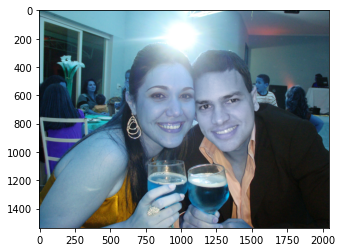

In [ ]:
img = cv2.imread('./phase-01-training/dataset-dist/phase-01/training/fake/010543abfbd0db1e9aa1b24604336e0c.png')
plt.imshow(img)
plt.show()

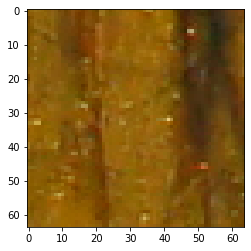

In [ ]:
plt.imshow(sample[450])
plt.show()

### 5.0.3. Generatin Patches

In [ ]:
try:
    os.mkdir('./patches')
    os.mkdir('./patches/train')
    os.mkdir('./patches/train/pristine')
    os.mkdir('./patches/train/fake')
    os.mkdir('./patches/test')
    os.mkdir('./patches/test/pristine')
    os.mkdir('./patches/test/fake')
    os.mkdir('./patches/validation')
    os.mkdir('./patches/validation/pristine')
    os.mkdir('./patches/validation/fake')
except:
    print('folders already created')

In [ ]:
img_patches, sample = extract_patches_and_labels('./data-prep/train/fake/010543abfbd0db1e9aa1b24604336e0c.png',
                                                                            './groundtruths/inverted-masks/010543abfbd0db1e9aa1b24604336e0c.mask.png',
                                                                            size = (64, 64), stride = (2,2), padding = 'VALID', sample = False)

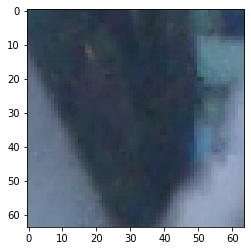

In [ ]:
plt.imshow(img_patches[450])
plt.show()

In [ ]:
# creating train fake patches
index = 0
for file in tqdm(os.listdir('./data-prep/train/fake/')):
  try:
    img_path = './data-prep/train/fake/' + file
    mask_path = ''
    if file.startswith('Tp'):
      img_parts = file.split('_')
      img_parts = img_parts[-1]
      img_parts = img_parts.split('.')
      mask_path = './groundtruths/CASIA-2-Groundtruth2/' + img_parts[-2] + '_gt.png' 
    else:
      img_parts = file.split('.')
      mask_path = './groundtruths/inverted-masks/' + img_parts[0] + '.mask.png'
    if mask_path != '':
      sample, img_patches =  custom_patch_extractor(img_path, mask_path)
      for i in range(len(img_patches)):
        cv2.imwrite('./patches/train/fake/' + file + '_' + str(sample[i]) + '.png', img_patches[i])
  except Exception as e:
    print(file)

100%|██████████| 3621/3621 [1:14:58<00:00,  1.24s/it]


In [ ]:
# extracting trian pristine patches
index = 0
for file in tqdm(os.listdir('./data-prep/train/fake/')):
  try:
    img_path = './data-prep/train/fake/' + file
    mask_path = ''
    if file.startswith('Tp'):
      img_parts = file.split('_')
      img_parts = img_parts[-1]
      img_parts = img_parts.split('.')
      mask_path = './groundtruths/CASIA-2-Groundtruth2/' + img_parts[-2] + '_gt.png' 
    else:
      img_parts = file.split('.')
      mask_path = './groundtruths/inverted-masks/' + img_parts[0] + '.mask.png'
    if mask_path != '':
      sample, img_patches =  extract_pristine_patches(img_path, mask_path)
      for i in range(len(img_patches)):
        cv2.imwrite('./patches/train/pristine/' + file + '_' + str(sample[i]) + '.png', img_patches[i])
  except:
    print(file) 

  1%|          | 26/3621 [00:06<13:26,  4.45it/s]

Tp_D_NRN_M_N_nat10134_nat10124_11913.jpg


  3%|▎         | 93/3621 [00:36<14:48,  3.97it/s]

d9b9f5db7d29a3855cceef574145b595.png


 20%|█▉        | 720/3621 [05:42<11:22,  4.25it/s]

cc263a4c9ff9943acbb9049f637a0bed.png


 22%|██▏       | 798/3621 [06:25<17:42,  2.66it/s]

Tp_D_CNN_M_N_sec00011_cha00085_11227.jpg


 30%|██▉       | 1070/3621 [08:34<15:11,  2.80it/s]

Tp_S_NNN_S_N_art20077_art20077_01883.tif


 31%|███▏      | 1134/3621 [09:04<08:26,  4.91it/s]

ca472f184807aded538221ac0b5ac27b.png


 42%|████▏     | 1529/3621 [11:43<11:08,  3.13it/s]

Tp_D_NRN_M_N_nat10134_nat00095_11912.jpg


 47%|████▋     | 1708/3621 [12:29<04:01,  7.92it/s]

Tp_D_CRN_S_N_ani10191_ani10190_12437.jpg


 65%|██████▌   | 2364/3621 [18:06<03:25,  6.10it/s]

Tp_D_CRN_S_N_nat10130_pla00049_11524.jpg


 70%|███████   | 2535/3621 [19:08<08:02,  2.25it/s]

Tp_S_CRN_S_N_art00059_art00059_10508.tif


 76%|███████▌  | 2755/3621 [20:55<06:18,  2.29it/s]

Tp_S_NNN_S_N_ind20037_ind20037_01778.tif


 92%|█████████▏| 3344/3621 [26:02<02:23,  1.93it/s]

bc04da26ab41ce92565dd3c686dae6c8.png


100%|██████████| 3621/3621 [28:26<00:00,  2.12it/s]


In [ ]:
# extracting test pristine patches
index = 0
for file in tqdm(os.listdir('./data-prep/test/fake/')):
  try:
    img_path = './data-prep/test/fake/' + file
    mask_path = ''
    if file.startswith('Tp'):
      img_parts = file.split('_')
      img_parts = img_parts[-1]
      img_parts = img_parts.split('.')
      mask_path = './groundtruths/CASIA-2-Groundtruth2/' + img_parts[-2] + '_gt.png' 
    else:
      img_parts = file.split('.')
      mask_path = './groundtruths/inverted-masks/' + img_parts[0] + '.mask.png'
    if mask_path != '':
      sample, img_patches =  extract_pristine_patches(img_path, mask_path)
      for i in range(len(img_patches)):
        cv2.imwrite('./patches/test/pristine/' + file + '_' + str(sample[i]) + '.png', img_patches[i])
  except:
    print(file) 

 11%|█         | 152/1392 [00:52<19:55,  1.04it/s]

b0060704d02f1229b75cbd550c7267b4.png


 28%|██▊       | 388/1392 [02:39<04:47,  3.50it/s]

Tp_S_NND_S_N_sec20064_sec20064_01654.tif


 45%|████▌     | 633/1392 [04:34<43:05,  3.41s/it]

d4aff0ad5f4f99fc6cad4243b926eda7.png


 81%|████████  | 1130/1392 [08:19<00:42,  6.22it/s]

Tp_S_NNN_S_N_sec00012_sec00012_11230.jpg


 98%|█████████▊| 1365/1392 [09:39<00:09,  2.81it/s]

aa3b4f7caf9de8c1d6551c33045fb4c1.png


100%|██████████| 1392/1392 [09:49<00:00,  2.36it/s]


In [ ]:
# creating test fake patches
index = 0
for file in tqdm(os.listdir('./data-prep/test/fake/')):
  try:
    img_path = './data-prep/test/fake/' + file
    mask_path = ''
    if file.startswith('Tp'):
      img_parts = file.split('_')
      img_parts = img_parts[-1]
      img_parts = img_parts.split('.')
      mask_path = './groundtruths/CASIA-2-Groundtruth2/' + img_parts[-2] + '_gt.png' 
    else:
      img_parts = file.split('.')
      mask_path = './groundtruths/inverted-masks/' + img_parts[0] + '.mask.png'
    if mask_path != '':
      sample, img_patches =  custom_patch_extractor(img_path, mask_path)
      for i in range(len(img_patches)):
        cv2.imwrite('./patches/test/fake/' + file + '_' + str(sample[i]) + '.png', img_patches[i])
  except:
    print(file)

100%|██████████| 1392/1392 [28:56<00:00,  1.25s/it]


In [ ]:
# extracting validation pristine patches
index = 0
for file in tqdm(os.listdir('./data-prep/validation/fake/')):
  try:
    img_path = './data-prep/validation/fake/' + file
    mask_path = ''
    if file.startswith('Tp'):
      img_parts = file.split('_')
      img_parts = img_parts[-1]
      img_parts = img_parts.split('.')
      mask_path = './groundtruths/CASIA-2-Groundtruth2/' + img_parts[-2] + '_gt.png' 
    else:
      img_parts = file.split('.')
      mask_path = './groundtruths/inverted-masks/' + img_parts[0] + '.mask.png'
    if mask_path != '':
      sample, img_patches =  extract_pristine_patches(img_path, mask_path)
      for i in range(len(img_patches)):
        cv2.imwrite('./patches/validation/pristine/' + file + '_' + str(sample[i]) + '.png', img_patches[i])
  except:
    print(file) 

  6%|▌         | 34/557 [00:08<03:00,  2.89it/s]

Tp_D_NND_M_B_nat20098_nat20073_01602.tif


 83%|████████▎ | 461/557 [03:07<03:18,  2.07s/it]

Tp_S_NRD_S_N_arc20079_arc20079_01719.tif


100%|██████████| 557/557 [03:51<00:00,  2.40it/s]


In [ ]:
# creating validation fake patches
index = 0
for file in tqdm(os.listdir('./data-prep/validation/fake/')):
  try:
    img_path = './data-prep/validation/fake/' + file
    mask_path = ''
    if file.startswith('Tp'):
      img_parts = file.split('_')
      img_parts = img_parts[-1]
      img_parts = img_parts.split('.')
      mask_path = './groundtruths/CASIA-2-Groundtruth2/' + img_parts[-2] + '_gt.png'
    else:
      img_parts = file.split('.')
      mask_path = './groundtruths/inverted-masks/' + img_parts[0] + '.mask.png'
    if mask_path != '':
      sample, img_patches =  custom_patch_extractor(img_path, mask_path)
      for i in range(len(img_patches)):
        cv2.imwrite('./patches/validation/fake/' + file + '_' + str(sample[i]) + '.png', img_patches[i])
  except:
    print(file)

100%|██████████| 557/557 [10:09<00:00,  1.09s/it]


### 5.1. incorporating custom filters in tensorflow

#### 5.1.2. custom filters for feature extraction

In [ ]:
# a filter
filter1 = np.array([[[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]],
                    [[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]],
                    [[0,0,0], [0,0,0], [0,0,0], [-1,-2,-3], [1,2,3]],
                    [[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]],
                    [[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]]])
filtera1 = rotate(filter1, angle=90)
filtera2 = rotate(filter1, angle=180)
filtera3 = rotate(filter1, angle=270)


# d filter
filter2 = np.array([[[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]],
                    [[0,0,0], [-1,-2,-3],[2,4,6],[-1,-2,-3], [0,0,0]],
                    [[0,0,0], [2,4,6],[-4,-8,-12], [2,4,6],[0,0,0]],
                    [[0,0,0], [-1,-2,-3], [2,4,6], [-1,-2,-3], [0,0,0]],
                    [[0,0,0],[0,0,0],[0,0,0], [0,0,0], [0,0,0]]])


# b filter
fitler3 = np.array([[[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]],
                    [[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]],
                    [[0,0,0], [1,2,3], [-2,-4,-6], [1,2,3], [0,0,0]],
                    [[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]],
                    [[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]]])
filterb1 =  signal.convolve(filter2, filter2, mode='same')
filterb2 =  signal.convolve(filter2, filter2, mode='same')
filterb3 =  signal.convolve(filter2, filter2, mode='same')

# c filter
filter4 = np.array([[[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]], [[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]], [
    [0,0,0], [1,2,3],[-3,-6,-9],[3,6,9],[-1,-2,-3]], [[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]],
                    [[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]]])

#this is not filter
filter4RDT = np.array([[[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]],
                       [[0,0,0], [0,0,0], [1,2,3], [0,0,0], [0,0,0]],
                       [[0,0,0], [0,0,0], [-3,-6,-9], [0,0,0], [0,0,0]],
                       [[0,0,0], [0,0,0], [3,6,9], [0,0,0], [0,0,0]],
                       [[0,0,0], [0,0,0], [-1,-2,-3], [0,0,0], [0,0,0]]])


filterc1 =  signal.convolve(filter4, filter4, mode='same')
filterc2 =  signal.convolve(filter4.T, filter4.T, mode='same').reshape(5,5,3)
filterc3 =  signal.convolve(filter4RDT, filter4RDT, mode='same').reshape(5,5,3)

#e filter
filter5 = np.array([[[-1,-2,-3], [2,4,6], [-2,-4,-6], [2,4,6], [-1,-2,-3]],
                    [[2,4,6], [-6,-12,-18], [-8,-16,-24], [-6,-12,-18], [2,4,6]],
                   [[-2,-4,-6], [8,16,24], [-12,-24,-36], [8,16,24], [2,4,6]],
                    [[2,4,6], [-6,-12,-18], [8,16,24], [-6,-12,-18], [2,4,6]],
                    [[-1,-2,-3], [2,4,6], [-2,-4,-6], [2,4,6], [-1,-2,-3]]])

filter_list = [filter1.tolist(), filtera1.tolist(), filtera2.tolist(), filtera3.tolist(), filter2.tolist(),\
               fitler3.tolist(), filterb1.tolist(), filterb2.tolist(), filterb3.tolist(),\
               filter4.tolist(), filterc1.tolist(), filterc2.tolist(), filterc3.tolist(), filter5.tolist()]

In [ ]:
np.array([filter1,filtera1, filtera2, filtera3, filter2, fitler3, filterb1, filterb2, filterb3, filter4, filterc1]).shape

(11, 5, 5, 3)

### 5.2. Patch Extraction from images

In [ ]:
def create_mask_patch(img_dir, img_mask_dir, percent = 25):
  """
  Copyright: sobhan chatterjee
  https://github.com/SindhuSobhan
  used with permission from the copyright owner
  """
  # get image and its mask, convert them to numpy arrays
  img = Image.open(img_dir)
  img = np.array(img.resize((1080, 720))).astype(np.uint8)

  img_mask = Image.open(img_mask_dir)
  img_mask = np.array(img_mask.resize((1080, 720))).astype(np.uint8)

  # Convert mask to binary
  image_mask = Image.fromarray(img_mask) # convert array to image
  img_binary= np.invert(np.array(image_mask.convert('1'))).astype(int) #Invert the array to get 1's where the mask is , and 0 elsewhere

  # Find Mask Dimensions within a square
  mask = np.nonzero(img_binary) #Gives output in row first, column second format, i.e. y axis first, x axis second
  mask_r = (mask[0].max() - mask[0].min()) #Row first
  mask_c = (mask[1].max() - mask[1].min()) #Column Second
  print("Sorted Mask indices:", np.sort(mask[0]), np.sort(mask[1]))
  print("Mask Width and Height:", mask_r, mask_c, sep = '\t') 

  # Find Mask Centres
  mask_rc = int(mask_r*0.5 + mask[0].min())
  mask_cc = int(mask_c*0.5 + mask[1].min())
  #print("Mask Center:", mask_rc, mask_cc, sep = '\t')

  # Draw a rectangle around the mask
  mr1c1 = [int(mask_rc - mask_r * 0.5) , int(mask_cc - mask_c * 0.5)]
  mr2c1 = [int(mask_rc + mask_r * 0.5) , int(mask_cc - mask_c * 0.5)]
  mr1c2 = [int(mask_rc - mask_r * 0.5) , int(mask_cc + mask_c * 0.5)]
  mr2c2 = [int(mask_rc + mask_r * 0.5) , int(mask_cc + mask_c * 0.5)]
  #print("Mask Corners:", mr1c1, mr2c1, mr1c2, mr2c2, "\n")

  # Find New mask patch size ensuring 25% of pixel density (area) comes from the mask
  new_img_sz = np.ceil(np.sqrt(mask_r * mask_c * 100/ percent)).astype(int)

  # Find new patch corners such that it surrounds the mask
  r1c1 = [int(mask_rc - new_img_sz * 0.5) , int(mask_cc - new_img_sz * 0.5)]
  r2c1 = [int(mask_rc + new_img_sz * 0.5) , int(mask_cc - new_img_sz * 0.5)]
  r1c2 = [int(mask_rc - new_img_sz * 0.5) , int(mask_cc + new_img_sz * 0.5)]
  r2c2 = [int(mask_rc + new_img_sz * 0.5) , int(mask_cc + new_img_sz * 0.5)]

  # Check if patch is shorter or smaller than the mask
  if (r1c1[0] > mr1c1[0]) and (r2c1[0] < mr2c1[0]):
    r1c1[0] = mr1c1[0]
    r2c1[0] = mr2c1[0]
    r1c2[0] = mr1c2[0]
    r2c2[0] = mr2c2[0]
  elif (r1c1[1] > mr1c1[1]) and (r1c2[1] < mr1c2[1]):
    r1c1[1] = mr1c1[1]
    r2c1[1] = mr2c1[1]
    r1c2[1] = mr1c2[1]
    r2c2[1] = mr2c2[1]
  

  print(mr1c1, mr2c1, mr1c2, mr2c2)
  print("New Patch Corners:", r1c1, r2c1, r1c2, r2c2, "\n")

  # Extract patches
  cropped_img_mask = img_mask[r1c1[0] : r2c1[0], r1c1[1] : r1c2[1]]
  cropped_img = img[r1c1[0] : r2c1[0], r1c1[1] : r1c2[1]]

  # Prepare parameters
  images = {'image': img, 'mask': img_mask}
  mask_dim = [mask_r, mask_c, mask_rc, mask_cc]
  mask_corners = [mr1c1, mr1c2, mr2c1, mr2c2]
  patch_corners = [r1c1, r1c2, r2c1, r2c2]
  params = {'images': images, 'mask_dim': mask_dim, 'mask_corners': mask_corners, 'patch_corners': patch_corners}


  return cropped_img_mask, cropped_img, params


In [ ]:
plt.figure(figsize = (6,6))
dst = cv2.addWeighted(cropped_img_1,0.2,cropped_img_mask_1,0.5,0)
plt.imshow(dst)

In [ ]:
def extract_patches_and_labels(img, img_mask, size = (64, 64), stride = (32,32), padding = 'VALID', sample = False):
  # Get the shape of the image patches
  img = Image.open(img)
  img = np.array(img.resize((1080, 720))).astype(np.uint8)

  img_mask = Image.open(img_mask)
  img_mask = np.array(img_mask.resize((1080, 720))).astype(np.uint8)
  (h, w, c) = img.shape
  # To get atleast 50 sub patches
  # if h//64 < 4:
  #   size = (h//4, h//4)
  #   stride = (h//8, h//8)

  # Extract patches from the original image patch
  img_tmp = tf.image.extract_patches(images= img.reshape(1,h, w, c),
                        strides=[1, stride[0], stride[1], 1],
                        sizes=[1, size[0], size[1], 1],
                        rates=[1, 1, 1, 1],
                        padding= padding)
  img = img_tmp.numpy()
  
  # Convert image to binary and extract patches from the mask patch
  img_mask = Image.fromarray(img_mask) # convert array to image
  img_mask = np.invert(np.array(img_mask.convert('1'))).astype(int) #Invert the array to get 1's where the mask is , and 0 elsewhere
  (h, w) = img_mask.shape
  img_tmp = tf.image.extract_patches(images= img_mask.reshape(1,h, w, 1),
                        strides=[1, stride[0], stride[1], 1],
                        sizes=[1, size[0], size[1], 1],
                        rates=[1, 1, 1, 1],
                        padding= padding)
  img_mask = img_tmp.numpy()

  # Reshape image and mask to number of patches * height * width * channels
  (h_patches, w_patches) = img_tmp.shape[1], img_tmp.shape[2]
  img_patches = img.reshape(h_patches * w_patches, size[0], size[1], c)
  img_mask_patches = img_mask.reshape(h_patches * w_patches, size[0], size[1], 1)

  # Declare the labels based on the percentage of mask portion in a sub patch. 1 for more than 5 percent occupied else 0.
  label = np.array([1 if (np.sum(img_mask_patches[i]) > 0.05*size[0]*size[1]) else 0 for i in range(img_mask_patches.shape[0])])

  # Resize image and mask sub patches to 64*64
  if size[1] != 64:
    img_patches = tf.image.resize(
      img_patches, (64,64), method = 'nearest', preserve_aspect_ratio=False
    ).numpy()

    img_mask_patches = tf.image.resize(
      img_mask_patches, (64,64), method = 'nearest', preserve_aspect_ratio=False
    ).numpy()

  # Sample from available subpatches based on the the label of subpatches, such that 1s and 0s are equal in number
  if sample:
    sample_sz =  sum(label) if (sum(label) < (img_patches.shape[0] - sum(label))) else (img_patches.shape[0] - sum(label))
    i1 = random.sample(np.nonzero(label)[0].tolist(), sample_sz)
    i2 = random.sample(np.nonzero(np.invert(label.astype(bool)))[0].tolist(), sample_sz)
    img_patches = img_patches[i1 + i2]
    img_mask_patches = img_mask_patches[i1 + i2]
    label = np.r_[np.ones(len(i1)), np.zeros((len(i2)))].astype(int)

  return img_patches, np.squeeze(img_mask_patches), label, (h_patches, w_patches)

In [ ]:
# Get the  patch and parameters
#(cropped_img_mask, cropped_img, params) = create_mask_patch('./image3.png', './image_3_mask.png', 25)
(img_patches, img_mask_patches, label,  params_1) = extract_patches_and_labels('../dataset/train/fake/c3cd547094fa52e65a22228bba5ef189.png',
                                                                  '../phase-01-training/dataset-dist/phase-01/training/fake/c3cd547094fa52e65a22228bba5ef189.mask.png')
#(cropped_img_mask_2, cropped_img_2, params_2) = create_mask_patch('./image_4.png', './image_4_mask.png', 25)

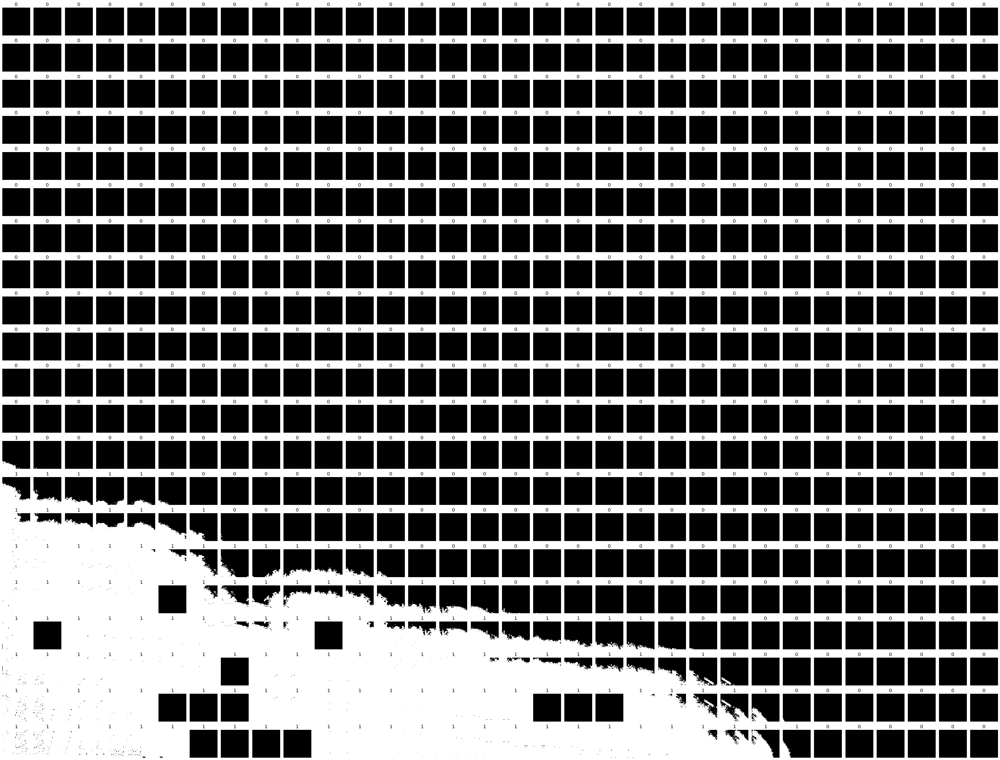

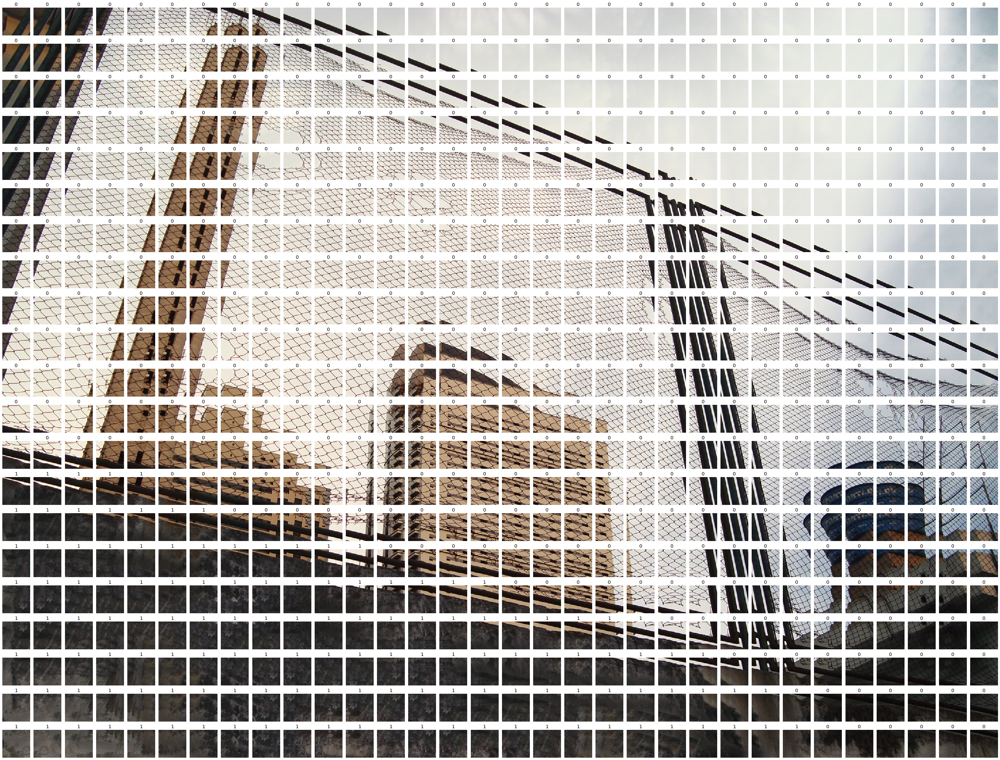

In [ ]:
plt.style.use("ggplot")

h_patches = params[0]
w_patches = params[1]

(fig, ax) = plt.subplots(h_patches, w_patches, figsize=(h_patches*2, w_patches))

# loop over the loss names
count = 0

for i in range (h_patches):
  for j in range(w_patches):
    ax[i,j].imshow(img_mask_patches[count,...], cmap='gray')
    ax[i,j].set_title(str(label[count]))
    ax[i,j].axis('off')
    count = count+1
plt.tight_layout()

(fig, ax) = plt.subplots(params[0], params[1], figsize=(h_patches*2, w_patches))

# loop over the loss names
count = 0

for i in range (h_patches):
  for j in range(w_patches):
    ax[i,j].imshow(img_patches[count,...])
    ax[i,j].set_title(str(label[count]))
    ax[i,j].axis('off')
    count = count+1
plt.tight_layout()

In [ ]:
def extract_pristne_patches(img, size = (64, 64), stride = (32,32), padding = 'VALID', sample = False):
  # Get the shape of the image patches
  img = Image.open(img)
  img = np.array(img.resize((1080, 720))).astype(np.uint8)
  try:
    (h, w, c) = img.shape
    img_tmp = tf.image.extract_patches(images= img.reshape(1,h, w, c),
                        strides=[1, stride[0], stride[1], 1],
                        sizes=[1, size[0], size[1], 1],
                        rates=[1, 1, 1, 1],
                        padding= padding)
    img = img_tmp.numpy()
    
    (h_patches, w_patches) = img_tmp.shape[1], img_tmp.shape[2]
    img_patches = img.reshape(h_patches * w_patches, size[0], size[1], c)
  except:
    (h ,w) = img.shape
    img_tmp = tf.image.extract_patches(images= img.reshape(1,h, w, 1),
                        strides=[1, stride[0], stride[1], 1],
                        sizes=[1, size[0], size[1], 1],
                        rates=[1, 1, 1, 1],
                        padding= padding)
    img = img_tmp.numpy()
    
    (h_patches, w_patches) = img_tmp.shape[1], img_tmp.shape[2]
    img_patches = img.reshape(h_patches * w_patches, size[0], size[1])
  # To get atleast 50 sub patches
  # if h//64 < 4:
  #   size = (h//4, h//4)
  #   stride = (h//8, h//8)

  # Extract patches from the original image patch

  
  
  if size[1] != 64:
    img_patches = tf.image.resize(
      img_patches, (64,64), method = 'nearest', preserve_aspect_ratio=False
    ).numpy()

  if sample:
    sample_sz =  sum(label) if (sum(label) < (img_patches.shape[0] - sum(label))) else (img_patches.shape[0] - sum(label))
    i1 = random.sample(np.nonzero(label)[0].tolist(), sample_sz)
    i2 = random.sample(np.nonzero(np.invert(label.astype(bool)))[0].tolist(), sample_sz)
    img_patches = img_patches[i1 + i2]

  return img_patches, (h_patches, w_patches)

In [ ]:
(img_patches, params) = extract_pristne_patches('../dataset/train/fake/010543abfbd0db1e9aa1b24604336e0c.png')

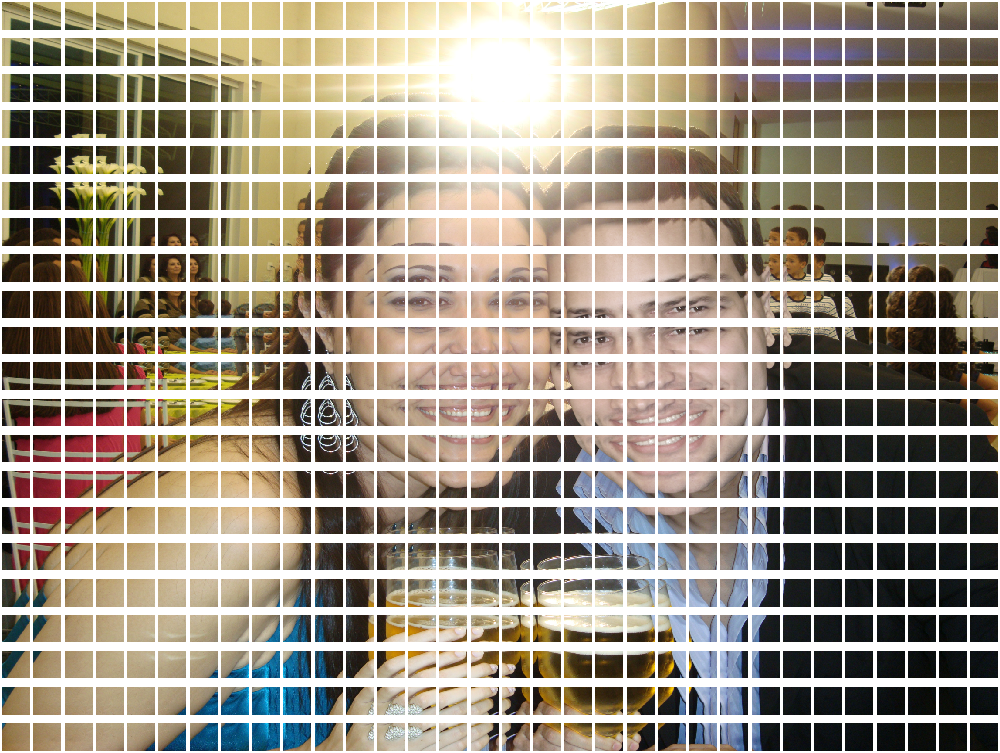

In [ ]:
plt.style.use("ggplot")

h_patches = params[0]
w_patches = params[1]

(fig, ax) = plt.subplots(h_patches, w_patches, figsize=(h_patches*2, w_patches))

# loop over the loss names
count = 0

for i in range (h_patches):
  for j in range(w_patches):
    ax[i,j].imshow(img_patches[count,...])
    ax[i,j].axis('off')
    count = count+1
plt.tight_layout()

#### 5.2.1. Extraction of patches and saving them 

In [ ]:
import pickle
images_pristine = []
images_fake = []
original_labels_pristine = []
original_labels_fake = []
original_img_pristine_name = []
original_img_fake_name = []
mask = []
mask_label = []
mask_original_name = []

In [ ]:
def extract_and_save_patches(img_path: str, img_mask_path: str, originalLabel = 1):
  if not os.path.isdir('../dataset/patches/'):
    os.mkdir('../dataset/patches/')
    os.mkdir('../dataset/patches/pristine/')
    os.mkdir('../dataset/patches/fake/')
    os.mkdir('../dataset/patches/masks/')
  label = []
  if(originalLabel == 1):
    # (cropped_img_mask_1, cropped_img_1, params_1) = create_mask_patch(img_path, img_mask_path, 25)
    (img_patches, img_mask_patches, label, params) = extract_patches_and_labels(img_path, img_mask_path)
  else:
    (img_patches, params) = extract_pristne_patches(img_path)
    label = list(range(img_patches.shape[0]))
  h_patches = params[0]
  w_patches = params[1]
  # image name
  path_arr = img_path.split('/')
  name = path_arr[-1].split('.')[0]
  count = 0
  for i in label:
      # im = Image.fromarray(img_patches[count,...].astype(np.uint8))
      if originalLabel == 0:
        # im = img_patches[count,...]
        # images_pristine.append(im)
        # original_labels_pristine.append(originalLabel)
        # original_img_pristine_name.append(name)
        im = img_patches[count,...]
        im = Image.fromarray(im)
        im.save('../dataset/patches/pristine/0_0_' + str(count) + "_" +name, 'png')
      elif originalLabel == 1:
        if (i == 0):
          im = img_patches[count,...]
          im = Image.fromarray(im)
          im.save('../dataset/patches/pristine/0_0_' + str(count) + "_" + name, 'png')
          # 
          # images_pristine.append(im)
          # original_labels_pristine.append(originalLabel)
          # original_img_pristine_name.append(name)
        if i == 1:
          im = img_patches[count,...]
          im = Image.fromarray(im)
          im.save('../dataset/patches/fake/1_0_' + str(count) + "_" + name, 'png')
          # images_fake.append(im)
          # original_labels_fake.append(originalLabel)
          # original_img_fake_name.append(name)

        im_mask = img_mask_patches[count,...].astype(np.uint8)
        # im_mask = im_mask.reshape((64,64,3))
        im = Image.fromarray(im_mask)
        im.save('../dataset/patches/masks/' + str(i) + '_0_' + str(count) + "_" + name+'.mask', 'png')
        # mask.append(im_mask)
        # mask_label.append(i)
        # mask_original_name.append(name)
      count = count+1 


In [ ]:
extract_and_save_patches('../dataset/train/fake/c3cd547094fa52e65a22228bba5ef189.png',
                                                                  '../phase-01-training/dataset-dist/phase-01/training/fake/c3cd547094fa52e65a22228bba5ef189.mask.png', originalLabel = 1)


#### 5.2.2. saving Image Patches

In [ ]:
for i in tqdm(os.listdir('../dataset/train/fake/')):
  tmp_arr = i.split('.')
  img_path = '../dataset/train/fake/' + tmp_arr[0] + '.png'
  img_mask_path = '../phase-01-training/dataset-dist/phase-01/training/fake/' + tmp_arr[0] + '.mask.png'
  extract_and_save_patches(img_path, img_mask_path, originalLabel = 1)

100%|██████████| 360/360 [04:43<00:00,  1.27it/s]


In [ ]:
for i in tqdm(os.listdir('../dataset/train/pristine/')):
  try:
    tmp_arr = i.split('.')
    img_path = '../dataset/train/pristine/' + tmp_arr[0] + '.png'
    extract_and_save_patches(img_path, '', originalLabel = 0)
  except:
    print(i)

100%|██████████| 839/839 [08:48<00:00,  1.59it/s]


#### 5.2.3. Sampling from the photo patches

- Let's take all the fake patches and equal number of pristine image patches

In [ ]:
# read all the file names
files = [f for f in os.listdir('../dataset/patches/pristine/')]
random_files = np.random.choice(files, 51657)

In [ ]:
print("Number of fake images in the sample ", len(os.listdir('../dataset/patches/fake/')))
print("Number of train images in the sample ", len(random_files))

Number of fake images in the sample  51657
Number of train images in the sample  51657


In [ ]:
fake_image_files = [f for f in os.listdir('../dataset/patches/fake/')]

train_pristine, test_pristine = train_test_split(random_files, test_size=0.2)
train_fake, test_fake = train_test_split(fake_image_files, test_size=0.2)

In [ ]:
try:
  os.mkdir('../dataset/generated')
  os.mkdir('../dataset/generated/train')
  os.mkdir('../dataset/generated/train/pristine')
  os.mkdir('../dataset/generated/train/fake')
  os.mkdir('../dataset/generated/test')
  os.mkdir('../dataset/generated/test/pristine')
  os.mkdir('../dataset/generated/test/fake')
except:
  print('It seems already created')

It seems already created


In [ ]:
for f in train_pristine:
  shutil.copy('../dataset/patches/pristine/' + f, '../dataset/generated/train/pristine/')

for f in test_pristine:
  shutil.copy('../dataset/patches/pristine/' + f, '../dataset/generated/test/pristine/')

for f in train_fake:
  shutil.copy('../dataset/patches/fake/'+ f, '../dataset/generated/train/fake/')

for f in test_fake:
  shutil.copy('../dataset/patches/fake/'+ f, '../dataset/generated/test/fake/') 

In [ ]:
# rename all the images
for f in tqdm(os.listdir('../dataset/generated/train/pristine/')):
  shutil.move('../dataset/generated/train/pristine/' + f, '../dataset/generated/train/pristine/' + f + '.png')

for f in tqdm(os.listdir('../dataset/generated/train/fake/')):
  shutil.move('../dataset/generated/train/fake/' + f, '../dataset/generated/train/fake/' + f + '.png')

for f in tqdm(os.listdir('../dataset/generated/test/pristine/')):
  shutil.move('../dataset/generated/test/pristine/' + f, '../dataset/generated/test/pristine/' + f + '.png')

for f in tqdm(os.listdir('../dataset/generated/test/fake/')):
  shutil.move('../dataset/generated/test/fake/' + f, '../dataset/generated/test/fake/' + f + '.png')



100%|██████████| 10332/10332 [00:00<00:00, 87071.10it/s]


### 5.3. SCNN Network

In [ ]:
%load_ext tensorboard

In [ ]:
Inp = Input(shape = (64, 64, 3))
x = Conv2D(14, (5,5), padding = 'same', name = 'conv2d_1')(Inp)
x = Conv2D(16, (5,5), kernel_initializer= 'glorot_normal', name = 'conv2d_2')(x)
x = ZeroPadding2D((1,1))(x)
x = BatchNormalization()(x)
x = Activation('tanh')(x)
x = MaxPooling2D((2,2))(x)
x = Conv2D(32, (5,5), padding = 'same',kernel_initializer= 'glorot_normal', name = 'conv2d_3')(x)
x = BatchNormalization()(x)
x = Activation('tanh')(x)
x = MaxPooling2D((2,2))(x)
x = Conv2D(64, (3,3), padding = 'same',kernel_initializer= 'glorot_normal', name = 'conv2d_4')(x)
x = BatchNormalization()(x)
x = Activation('tanh')(x)
x = MaxPooling2D((2,2))(x)
x = Conv2D(128, (1,1), padding = 'same',kernel_initializer= 'glorot_normal', name = 'conv2d_5')(x)
x = BatchNormalization()(x)
x = Activation('tanh')(x)
x = MaxPooling2D((2,2))(x)
x = Conv2D(256, (1,1), padding = 'same',kernel_initializer= 'glorot_normal', name = 'conv2d_6')(x)
x = BatchNormalization()(x)
x = Activation('tanh')(x)
x = AveragePooling2D((2,2))(x)
x = Flatten()(x)
out = Dense(1, activation = 'sigmoid',kernel_initializer= 'glorot_normal', name = 'ouput')(x)

model = Model(inputs = [Inp], outputs = [out])
model.summary()

#plot_model(model, show_shapes =True)

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 14)        1064      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 60, 60, 16)        5616      
_________________________________________________________________
zero_padding2d (ZeroPadding2 (None, 62, 62, 16)        0         
_________________________________________________________________
batch_normalization (BatchNo (None, 62, 62, 16)        64        
_________________________________________________________________
activation (Activation)      (None, 62, 62, 16)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 31, 31, 16)        0     

In [ ]:
os.mkdir('logs2')
os.mkdir('logs2/fit')

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
log_dir = "logs2/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
filepath = './models/model-tanh2.h5';
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1, write_images=True)

In [ ]:
earlyStopping = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=10, verbose=0, mode='auto',
    baseline=None, restore_best_weights=False
)

#### 5.3.1. Setting weights

In [ ]:
layer = model.get_layer('conv2d_1')
layer.set_weights([np.array(filter_list).astype(np.float32).reshape(5,5,3,14), np.zeros(14,)])

### 5.4. Data Augmentation

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1/255.0,shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)
validation_datagen = ImageDataGenerator(rescale=1/255.0)

# Flow training images in batches of 128 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        './patches/train',  # This is the source directory for training images
        target_size=(64, 64),  # All images will be resized to 64x64
        batch_size=32,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        './patches/test/',  # This is the source directory for validation images
        target_size=(64, 64),  # All images will be resized to 64x64
        batch_size=32,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

Found 2996353 images belonging to 2 classes.
Found 1162500 images belonging to 2 classes.


### 5.5. Training and Validation

In [ ]:
history = model.fit(
      train_generator,  
      epochs=100,
    validation_data = validation_generator,
      verbose=1,
      callbacks=[tensorboard_callback, checkpoint, earlyStopping])

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 93637 steps, validate for 36329 steps
Epoch 1/100
93635/93637 [============================>.] - ETA: 0s - loss: 0.5863 - accuracy: 0.6855
Epoch 00001: val_loss improved from inf to 0.59174, saving model to ./models/model-tanh2.h5
93637/93637 [==============================] - 4133s 44ms/step - loss: 0.5863 - accuracy: 0.6855 - val_loss: 0.5917 - val_accuracy: 0.7225
Epoch 2/100
93636/93637 [============================>.] - ETA: 0s - loss: 0.4725 - accuracy: 0.7734
Epoch 00002: val_loss improved from 0.59174 to 0.44759, saving model to ./models/model-tanh2.h5
93637/93637 [==============================] - 4058s 43ms/step - loss: 0.4725 - accuracy: 0.7734 - val_loss: 0.4476 - val_accuracy: 0.7927
Epoch 3/100
93635/93637 [============================>.] - ETA: 0s - loss: 0.4267 - accuracy: 0.8009
Epoch 00003: val_loss improved from 0.44759 to 0.38610, saving model to ./models/model-tanh2.h5
93637/93637 [========================

In [ ]:
earlyStopping = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=10, verbose=0, mode='auto',
    baseline=None, restore_best_weights=False
)
history = model.fit(
      train_generator,  
      epochs=100,
    validation_data = validation_generator,
      verbose=1,
      callbacks=[tensorboard_callback, checkpoint, earlyStopping])

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 93637 steps, validate for 36329 steps
Epoch 1/100
93635/93637 [============================>.] - ETA: 0s - loss: 0.3111 - accuracy: 0.8633
Epoch 00001: val_loss improved from 0.32125 to 0.31642, saving model to ./models/model-tanh.h5
93637/93637 [==============================] - 4081s 44ms/step - loss: 0.3111 - accuracy: 0.8633 - val_loss: 0.3164 - val_accuracy: 0.8590
Epoch 2/100
93636/93637 [============================>.] - ETA: 0s - loss: 0.3087 - accuracy: 0.8644
Epoch 00002: val_loss did not improve from 0.31642
93637/93637 [==============================] - 4052s 43ms/step - loss: 0.3087 - accuracy: 0.8644 - val_loss: 0.3191 - val_accuracy: 0.8581
Epoch 3/100
93636/93637 [============================>.] - ETA: 0s - loss: 0.3075 - accuracy: 0.8648
Epoch 00003: val_loss did not improve from 0.31642
93637/93637 [==============================] - 4043s 43ms/step - loss: 0.3075 - accuracy: 0.8648 - val_loss: 0.3215 - val_ac

### F-CNN 

#### Wavelet Transform


In [ ]:
def DDWT(img, level: int, wavelet: str):
  c = pywt.wavedec2(img, wavelet=wavelet, level = level)
  # normalize each coefficient array independently for better visibility
  # c[0] /= np.abs(c[0]).max()
  return c

##### Features from wavelet transform

In [ ]:
def get_avg_of_array(array):
  return array.mean()

def get_var_of_array(array):
  return np.var(array)

def get_energy_in_array(array):
  return np.sum(np.square(array))


def get_entropy_in_array(array):
  return -np.sum(np.multiply(array,np.log(array)))

def get_sharpness_in_subband(array):
  con = 0
  for i in range(array.shape[0]):
    for j in range(array.shape[1]):
      con += ((i - j)**2) * array[i][j]
  return con

def get_degree_change(array):
  Im = 0
  for i in range(array.shape[0]):
    for j in range(array.shape[1]):
      if ( i != j):
        Im += array[i][j] / abs(i - j)
  return Im

def get_homoginity(array):
  Idm = 0
  for i in range(array.shape[0]):
    for j in range(array.shape[1]):
      Idm += array[i][j] / ( 1 + ( i - j )**2)
  return Idm

In [ ]:
def extract_features(array):
  mean = get_avg_of_array(array)
  var = get_var_of_array(array)
  energy = get_energy_in_array(array)
  entropy = get_entropy_in_array(array)
  sharpness = get_sharpness_in_subband(array)
  degree = get_degree_change(array)
  homoginity = get_homoginity(array)
  return [mean, var, energy, entropy, sharpness, degree, homoginity]

In [ ]:
def get_features(img, level, wavelet):
  #img = cv2.imread(path)
  features = list()
  # wavelet transform
  c = DDWT(img, level, wavelet)
  features.extend(extract_features(c[0]))

  for i in range(1, len(c)):
    for j in range(level):
      features.extend(extract_features(c[i][j]))
  #print(len(features))

  return features


In [ ]:
def get_features_for_image(image):
  wavelets = ['db1', 'db2', 'db3', 'db4', 'db5']
  features = list()
  # img = cv2.imread(path)
  img = image
  for i in range(img.shape[2]):
    for j in wavelets:
      features.extend(get_features(img[:,:, i], 3, j))
  return np.array(features).reshape(1050,1)

In [ ]:
# tensorflow model
Inp = Input(shape = (1050, 1))
x = Conv1D(100, 3,kernel_initializer=RandomNormal(seed=20), name='conv1')(Inp)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling1D((2), strides=2)(x)

x = Conv1D(100, 3, kernel_initializer=RandomNormal(seed=20), name='conv2')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = GlobalAvgPool1D()(x)

#x = Flatten()(x)
x = Dense(256, activation='relu',kernel_initializer=RandomNormal(seed=20))(x)
out = Dense(1, activation = 'sigmoid',kernel_initializer=RandomNormal(seed=20), name = 'ouput')(x)

model = Model(inputs = Inp, outputs = out)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1050, 1)]         0         
_________________________________________________________________
conv1 (Conv1D)               (None, 1048, 100)         400       
_________________________________________________________________
batch_normalization (BatchNo (None, 1048, 100)         400       
_________________________________________________________________
activation (Activation)      (None, 1048, 100)         0         
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 524, 100)          0         
_________________________________________________________________
conv2 (Conv1D)               (None, 522, 100)          30100     
_________________________________________________________________
batch_normalization_1 (Batch (None, 522, 100)          400   

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
# log_dir = "logs2/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
# filepath = './models/model-FCNN-Relu.h5';
# checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
# tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1, write_images=True)

In [ ]:
train_generator.class_indices

{'fake': 0, 'pristine': 1}

In [ ]:
def data_shuffle(data_path):
  # Identify the number of classes in the given directory.
  classes = sorted(os.listdir(data_path))
  #print(classes)
  no_of_classes = len(classes)
  img_array = list()
  # generate path and label array for the images in all classes
  tmp_class = 0
  for i in classes:
    for j in os.listdir(data_path + i):
      img_array.append([data_path + i + '/' + j, tmp_class])
    tmp_class += 1
  tf.random.shuffle(tf.Variable(img_array))
  print('{} images found in {} classes'.format(len(img_array), no_of_classes))
  return img_array

In [ ]:
data_shuffle('./patches/train/')[-10:]

ValueError: ignored

In [ ]:
def custom_data_gen_train(path, batch_size = 32):
  # get shuffled img paths and labels
  print(path)
  samples = data_shuffle(path)
  num_samples = len(samples)
  # while loop so that generators never terminates
  while True:
    for offset in range(0, num_samples, batch_size):
       # Get the samples you'll use in this batch
       batch_samples = samples[offset:offset+batch_size]

       #x and y for this batch
       x_train = []
       y_train = []

       for batch_sample in batch_samples:
         fileName = batch_sample[0]
         label = batch_sample[1]
         image = cv2.imread(fileName)
         features = get_features_for_image(image)
         x_train.append(features)
         y_train.append(label)
       yield np.array(x_train), np.array(y_train)


In [ ]:
train_datagen = custom_data_gen_train('./patches/train/')
validation_datagen = custom_data_gen_train('./patches/test/')

In [ ]:
%time
next(train_datagen)

CPU times: user 6 µs, sys: 0 ns, total: 6 µs
Wall time: 10.5 µs


(array([[[ 8.42728516e+02],
         [ 1.28599076e+05],
         [ 5.36825873e+07],
         ...,
         [-1.17044064e+04],
         [ 1.14186566e+01],
         [-1.96229052e+01]],
 
        [[ 6.77205078e+02],
         [ 1.78066584e+05],
         [ 4.07470913e+07],
         ...,
         [-3.70224145e+03],
         [-2.11535941e-01],
         [ 3.99519267e+00]],
 
        [[ 1.88988281e+02],
         [ 3.23732357e+04],
         [ 4.35774759e+06],
         ...,
         [ 1.32727460e+03],
         [-8.73158863e+01],
         [-1.39455703e+01]],
 
        ...,
 
        [[ 5.98972656e+02],
         [ 1.52389292e+05],
         [ 3.27140822e+07],
         ...,
         [-9.36172237e+03],
         [ 6.97353926e+01],
         [-3.11454165e+01]],
 
        [[ 3.75806641e+02],
         [ 2.79207964e+04],
         [ 1.08256914e+07],
         ...,
         [-8.31053191e+03],
         [-4.67221490e+00],
         [ 3.71353362e-01]],
 
        [[ 7.77486328e+02],
         [ 8.12634341e+04],
    

In [ ]:
history = model.fit(
      train_datagen,  
      epochs=1,
    validation_data = validation_datagen,
    steps_per_epoch=36328,
      verbose=1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 36328 steps
 6577/36328 [====>.........................] - ETA: 48:09:09 - loss: 0.6876 - accuracy: 0.5534

KeyboardInterrupt: ignored